In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset, Sampler
import numpy as np
import pyBigWig
from pyfaidx import Fasta
import pandas as pd
import random
import wandb
import time
from tqdm import tqdm
from scipy.stats import spearmanr
from datetime import timedelta
import os
import concurrent.futures




import sys
sys.path.append("/cluster/home/jjanssens/jjans/software")
sys.path.append("/cluster/home/jjanssens/jjans/software/cross_species_DL")

In [2]:
from cross_species_DL.src.datasets.peak_dataset import PeakDataset
from cross_species_DL.src.datasets.batch_sampling import BalancedBatchSampler, OversamplingBalancedBatchSampler

from cross_species_DL.src.utils.helpers import one_hot_encode,reverse_complement, GradReverse, grad_reverse, split_bed_by_chrom
from cross_species_DL.src.evaluation.eval import evaluate_model
from cross_species_DL.src.utils.helpers import load_and_filter_bed
from cross_species_DL.src.models.residual_dilated_cnn import ResidualDilatedCNN
from cross_species_DL.src.models.ResidualDilatedCNNWithSpecies import ResidualDilatedCNNWithSpecies

from cross_species_DL.src.training.train_model_flexamp import train_model_flexible_AMP


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

if device.type == "cuda":
    print("CUDA device name:", torch.cuda.get_device_name(0))
    print("Memory available (MB):", round(torch.cuda.get_device_properties(0).total_memory / 1024**2))

Using device: cuda
CUDA device name: Quadro RTX 6000
Memory available (MB): 24023


In [4]:
import os
celltype = 'Enterocytes'

bed_dict = {}
for species in ['Human','Bonobo','Chimpanzee','Gorilla','Macaque','Marmoset']:
    print(species)
    path_bed = f"/cluster/project/treutlein/USERS/jjans/analysis/adult_intestine/atac/consensus_peak_calling_{species}/MACS/{celltype}_peaks.narrowPeak"
    
    if os.path.exists(path_bed):
        regions_species = load_and_filter_bed(path_bed,qval_threshold=0.15,max_regions=30000)
        print(len(regions_species.index))
        bed_dict[species] = regions_species
    else:
        print(f"Warning: {species} BED file not found → {path_bed}")

Human
30000
Bonobo
30000
Chimpanzee
30000
Gorilla
30000
Macaque
30000
Marmoset
30000


In [5]:
import os

bw_dict = {}
for species in ['Human', 'Bonobo', 'Chimpanzee', 'Gorilla', 'Macaque', 'Marmoset']:
    bw_path = f'bigwigs/{species}_enterocytes.hg38.bw'
    bw_path = f'/cluster/project/treutlein/USERS/jjans/analysis/adult_intestine/atac/consensus_peak_calling_{species}/pseudobulk_bw_files/{celltype}.bw'
    if os.path.exists(bw_path):
        bw_dict[species] = bw_path
    else:
        print(f"⚠️ Missing bigWig for {species}: {bw_path}")

In [6]:
import os
fasta_dict = {
    'Human': '/cluster/home/jjanssens/jjans/analysis/cerebellum/genomes_new/homo_sapiens/hg38.fa',
    'Chimpanzee': '/cluster/home/jjanssens/jjans/data/intestine/nhp_atlas/genomes/reference_/panTro3/fasta/genome.fa',
    'Bonobo': '/cluster/home/jjanssens/jjans/data/intestine/nhp_atlas/genomes/reference_/panPan1/fasta/genome.fa',
    'Gorilla': '/cluster/home/jjanssens/jjans/data/intestine/nhp_atlas/genomes/reference_/gorGor4/fasta/genome.fa',
    'Macaque': '/cluster/home/jjanssens/jjans/data/intestine/nhp_atlas/genomes/reference_/Mmul10/fasta/genome.fa',
    'Marmoset': '/cluster/home/jjanssens/jjans/data/intestine/nhp_atlas/genomes/reference_/calJac1_mito/fasta/genome.fa',
}

# Check if files exist
for species, path in fasta_dict.items():
    if not os.path.exists(path):
        print(f"⚠️ Missing FASTA for {species}: {path}")

In [7]:
def split_all_species_beds(bed_dict, val_chroms, test_chroms):
    """
    Split each species' BED into train/val/test based on chromosome lists.

    Parameters
    ----------
    bed_dict : dict
        Dictionary with species as keys and BED DataFrames as values.
    val_chroms : list of str
        Chromosomes for validation split.
    test_chroms : list of str
        Chromosomes for test split.

    Returns
    -------
    dict
        Dictionary with structure:
        split_beds[species] = {'train': ..., 'val': ..., 'test': ...}
    """
    split_beds = {}

    for species, bed in bed_dict.items():
        all_chroms = list(set(bed['chr']))
        train_chroms = [ch for ch in all_chroms if ch not in val_chroms + test_chroms]

        print(f"{species} → Train chromosomes: {sorted(train_chroms)}")

        train_bed, val_bed, test_bed = split_bed_by_chrom(
            bed, train_chroms, val_chroms, test_chroms
        )

        split_beds[species] = {
            'train': train_bed,
            'val': val_bed,
            'test': test_bed
        }

    return split_beds

In [8]:
val_chroms = ["chr8", "chr20","8","20"]
test_chroms = ["chr1", "chr3", "chr6","1","3","6"]

split_beds = split_all_species_beds(bed_dict, val_chroms, test_chroms)

# Access example:
human_train = split_beds["Human"]["train"]
chimp_test = split_beds["Chimpanzee"]["test"]

Human → Train chromosomes: ['chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr2', 'chr21', 'chr22', 'chr4', 'chr5', 'chr7', 'chr9', 'chrX', 'chrY']
Bonobo → Train chromosomes: ['10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '21', '22', '2A', '2B', '4', '5', '7', '9', 'AJFE02000531.1', 'AJFE02000594.1', 'AJFE02000712.1', 'AJFE02001010.1', 'AJFE02001283.1', 'AJFE02001670.1', 'AJFE02002198.1', 'AJFE02002242.1', 'AJFE02002360.1', 'AJFE02002581.1', 'AJFE02002634.1', 'AJFE02002978.1', 'AJFE02003178.1', 'AJFE02003391.1', 'AJFE02003564.1', 'AJFE02003581.1', 'AJFE02003871.1', 'AJFE02003886.1', 'AJFE02003887.1', 'AJFE02004231.1', 'AJFE02004273.1', 'AJFE02004568.1', 'AJFE02004677.1', 'AJFE02005089.1', 'AJFE02005156.1', 'AJFE02005927.1', 'AJFE02006081.1', 'AJFE02006502.1', 'AJFE02006802.1', 'AJFE02006824.1', 'AJFE02007023.1', 'AJFE02007039.1', 'AJFE02007160.1', 'AJFE02007951.1', 'AJFE02008374.1', 'AJFE02009928.1', 'AJFE02010537.1', 'AJFE0201

In [9]:
# Create consistent label mapping: Human → 0, Bonobo → 1, etc.
species_list = sorted(split_beds.keys())
species_labels = {species: i for i, species in enumerate(species_list)}

# Print for reference
print("Species class labels:")
for species, label in species_labels.items():
    print(f"{species}: {label}")

# Set sequence length
seq_len = 2114

# Create datasets
dataset_dict = {}

for species in species_list:
    bed_splits = split_beds[species]
    bw_path = bw_dict.get(species)
    fa_path = fasta_dict.get(species)
    label = species_labels[species]

    if not bw_path or not fa_path:
        print(f"⚠️ Missing data for {species} — skipping dataset creation")
        continue

    dataset_dict[species] = {
        'train': PeakDataset(
            bed_splits['train'], bw_path, fa_path,
            label=label, seq_len=seq_len,
            augment=True, augment_both_strands=True,
            max_shift_size=5, seed=42, validate_regions=False
        ),
        'val': PeakDataset(
            bed_splits['val'], bw_path, fa_path,
            label=label, seq_len=seq_len,
            augment=False, validate_regions=False
        ),
        'test': PeakDataset(
            bed_splits['test'], bw_path, fa_path,
            label=label, seq_len=seq_len,
            augment=False, validate_regions=False
        )
    }

Species class labels:
Bonobo: 0
Chimpanzee: 1
Gorilla: 2
Human: 3
Macaque: 4
Marmoset: 5
[PeakDataset] Loaded 21700 valid regions. Removed 105 regions that were too close to chromosome edges or not found in bigWig/FASTA.
[PeakDataset] Loaded 1565 valid regions. Removed 1 regions that were too close to chromosome edges or not found in bigWig/FASTA.
[PeakDataset] Loaded 6629 valid regions. Removed 0 regions that were too close to chromosome edges or not found in bigWig/FASTA.
[PeakDataset] Loaded 21369 valid regions. Removed 23 regions that were too close to chromosome edges or not found in bigWig/FASTA.
[PeakDataset] Loaded 1839 valid regions. Removed 0 regions that were too close to chromosome edges or not found in bigWig/FASTA.
[PeakDataset] Loaded 6769 valid regions. Removed 0 regions that were too close to chromosome edges or not found in bigWig/FASTA.
[PeakDataset] Loaded 21743 valid regions. Removed 44 regions that were too close to chromosome edges or not found in bigWig/FASTA.
[

In [10]:
signal_stats = {}

for species, splits in dataset_dict.items():
    train_ds = splits.get('train')

    if train_ds is None:
        print(f"⚠️ No training dataset for {species}, skipping...")
        continue

    print(f"▶️ Sampling signal from: {species}")
    
    # Estimate distribution
    signal_values, stats = train_ds.sample_signal_distribution()
    
    # Compute robust min/max
    min_val, max_val = train_ds.compute_signal_min_max()

    # Store results
    signal_stats[species] = {
        'min': min_val,
        'max': max_val,
        'mean': stats['mean'],
        'std': stats['std'],
        **stats
    }

    print(f"  ↳ min={min_val:.4f}, max={max_val:.4f}, mean={stats['mean']:.4f}, std={stats['std']:.4f}")

▶️ Sampling signal from: Bonobo
  ↳ min=0.0372, max=1.8239, mean=0.4473, std=0.4186
▶️ Sampling signal from: Chimpanzee
  ↳ min=0.0377, max=2.6184, mean=0.5198, std=0.4729
▶️ Sampling signal from: Gorilla
  ↳ min=0.1343, max=4.9701, mean=1.0867, std=1.0988
▶️ Sampling signal from: Human
  ↳ min=0.0287, max=3.6207, mean=0.4956, std=0.6623
▶️ Sampling signal from: Macaque
  ↳ min=0.1011, max=7.3828, mean=1.5552, std=1.6580
▶️ Sampling signal from: Marmoset
  ↳ min=0.0266, max=2.7129, mean=0.3545, std=0.4946


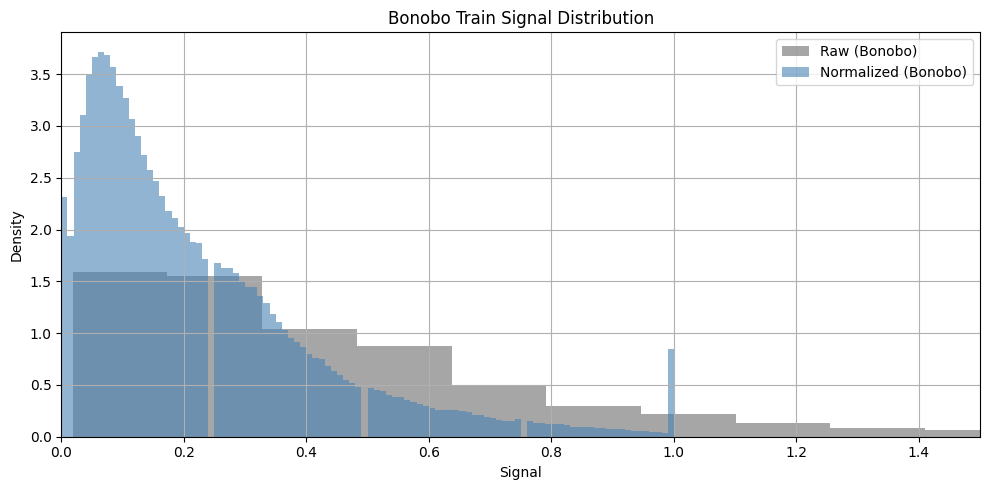

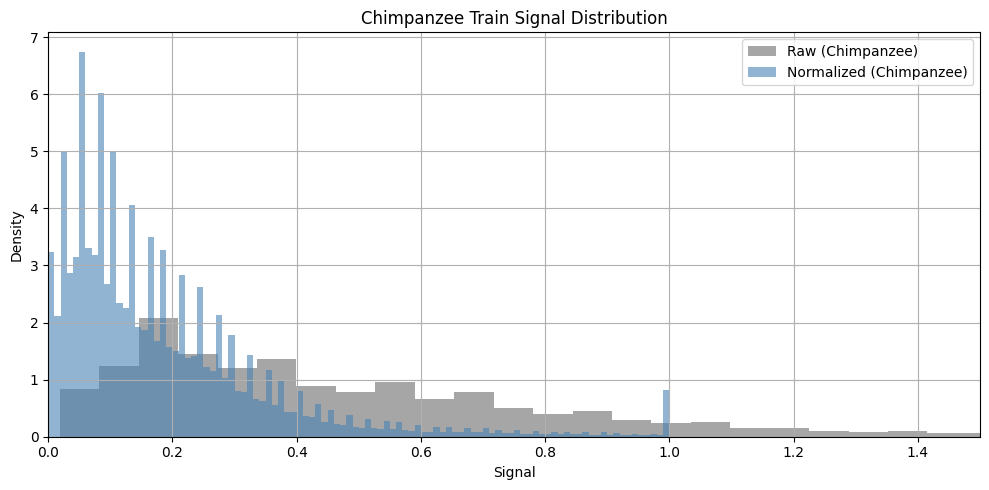

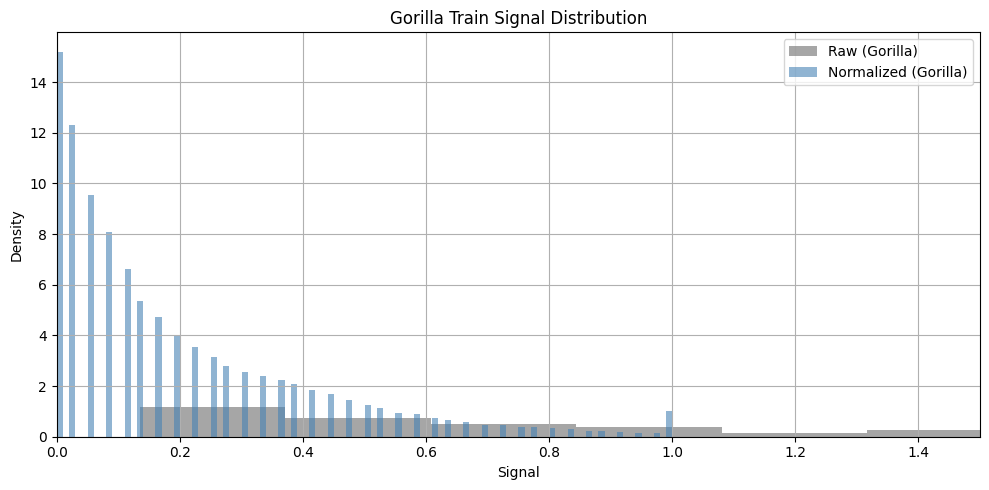

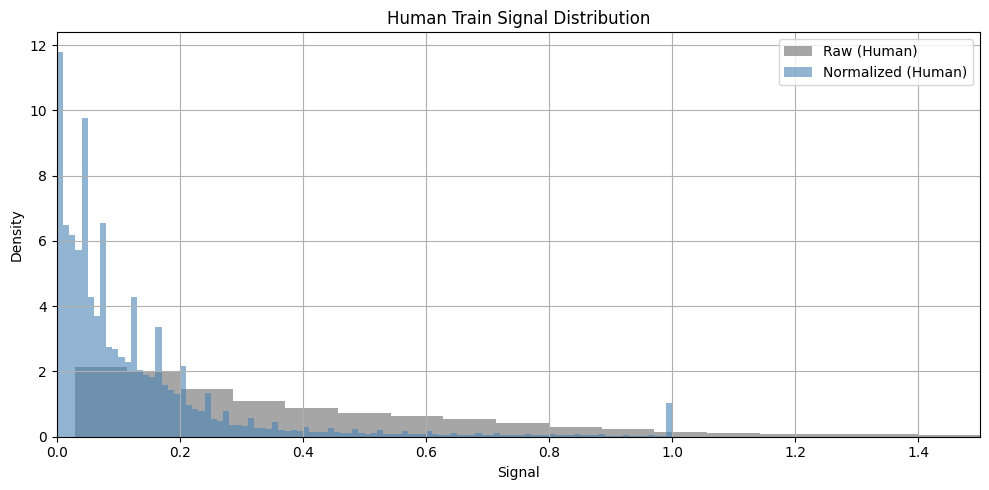

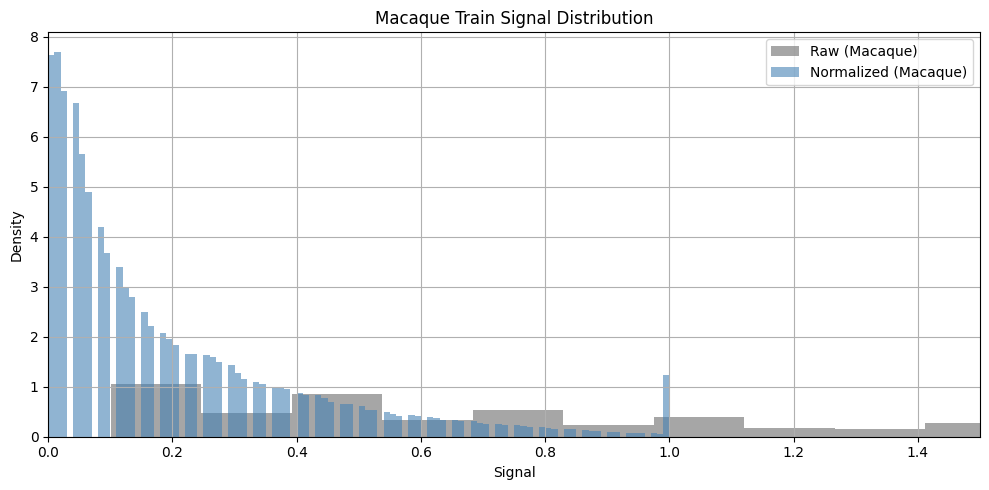

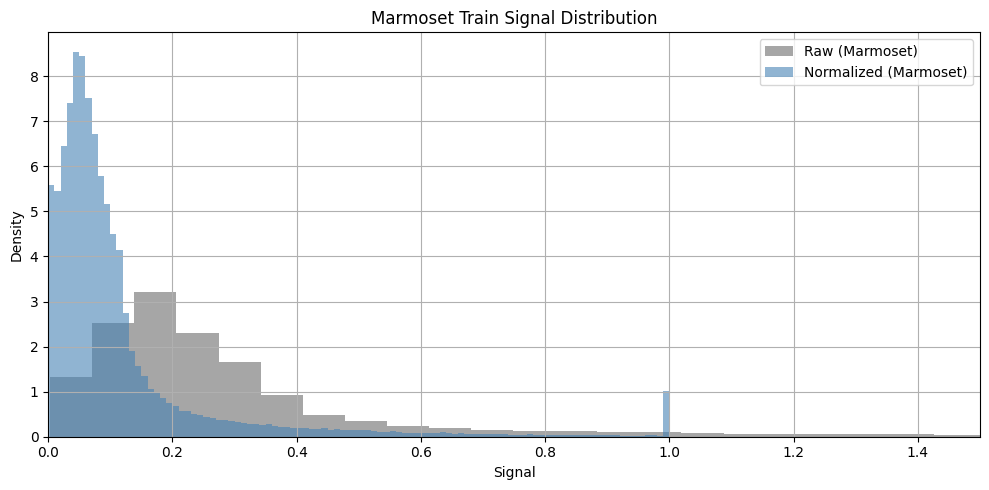

In [11]:
import matplotlib.pyplot as plt
import numpy as np

def normalize(values, global_min, global_max):
    return np.clip((values - global_min) / (global_max - global_min), 0, 1)

for species, ds in dataset_dict.items():
    if species not in signal_stats or 'train' not in ds:
        print(f"⚠️ Missing data for {species}, skipping...")
        continue

    train_ds = ds['train']
    stats = signal_stats[species]

    # Sample raw signal again to visualize (without recomputing stats)
    raw_values, _ = train_ds.sample_signal_distribution()
    norm_values = normalize(raw_values, stats['min'], stats['max'])

    # Plot
    plt.figure(figsize=(10, 5))
    plt.hist(raw_values, bins=100, label=f'Raw ({species})', color='gray', alpha=0.7, density=True)
    plt.hist(norm_values, bins=100, label=f'Normalized ({species})', color='steelblue', alpha=0.6, density=True)
    plt.title(f"{species} Train Signal Distribution")
    plt.xlabel("Signal")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.xlim([0, 1.5])
    plt.show()

In [12]:
# STEP 3: Apply normalization to ALL datasets using signal_stats
for species, splits in dataset_dict.items():
    if species not in signal_stats:
        print(f"⚠️ No normalization stats for {species}, skipping...")
        continue

    stats = signal_stats[species]
    for split_name in ['train', 'val', 'test']:
        ds = splits.get(split_name)
        if ds is None:
            continue
        ds.global_min = stats['min']
        ds.global_max = stats['max']
        ds.normalize_signal = True
        ds.normalization_mode = "minmax"

In [13]:
class SpeciesDatasetWrapper(torch.utils.data.Dataset):
    def __init__(self, dataset, species_idx):
        self.dataset = dataset
        self.species_idx = species_idx

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        x, y = self.dataset[idx]
        return x, y, self.species_idx  # Add species ID

In [14]:
from torch.utils.data import ConcatDataset, DataLoader

# Helper to extract datasets by split
def collect_split(split_name):
    return [splits[split_name] for splits in dataset_dict.values() if split_name in splits]


# Assign numeric species index
species_to_idx = {species: i for i, species in enumerate(dataset_dict.keys())}

# Wrap each train dataset
train_datasets = [
    SpeciesDatasetWrapper(splits["train"], species_to_idx[species])
    for species, splits in dataset_dict.items() if "train" in splits
]
val_datasets = [
    SpeciesDatasetWrapper(splits["val"], species_to_idx[species])
    for species, splits in dataset_dict.items() if "val" in splits
]
test_datasets = [
    SpeciesDatasetWrapper(splits["test"], species_to_idx[species])
    for species, splits in dataset_dict.items() if "test" in splits
]

# Concatenate
train_ds = ConcatDataset(train_datasets)
val_ds   = ConcatDataset(val_datasets)
test_ds  = ConcatDataset(test_datasets)

# Create BalancedBatchSampler for training (balanced across species)
from cross_species_DL.src.datasets.batch_sampling import BalancedBatchSampler, OversamplingBalancedBatchSampler

species_lengths = [len(ds) for ds in train_datasets]
sampler = BalancedBatchSampler(species_lengths, batch_size=144, seed=42)
train_loader = DataLoader(train_ds, batch_sampler=sampler)

# Validation and Test loaders (standard)
val_loader = DataLoader(val_ds, batch_size=66, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=66, shuffle=False)

In [20]:
import torch
from torch.utils.data import ConcatDataset, DataLoader
from cross_species_DL.src.datasets.batch_sampling import BalancedBatchSampler

# --- Wrap datasets to include species index ---
class SpeciesDatasetWrapper(torch.utils.data.Dataset):
    def __init__(self, dataset, species_idx):
        self.dataset = dataset
        self.species_idx = species_idx

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        x, y = self.dataset[idx]
        return x, y, self.species_idx  # Add species index
        
class SpeciesDatasetWrapper(torch.utils.data.Dataset):
    def __init__(self, dataset, species_idx):
        self.dataset = dataset
        self.species_idx = species_idx

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        out = self.dataset[idx]

        # If original dataset returns (x, y), append species_idx
        if len(out) == 2:
            x, y = out
            return x, y, self.species_idx

        # If original dataset already returns (x, y, ...), keep x and y, but replace species index
        elif len(out) >= 3:
            x, y = out[0], out[1]
            return x, y, self.species_idx

        raise ValueError("Unexpected dataset output format.")

# --- Assign numeric species indices ---
species_to_idx = {species: i for i, species in enumerate(dataset_dict.keys())}

# --- Helper to extract and wrap splits ---
def collect_wrapped_split(split_name):
    return [
        SpeciesDatasetWrapper(splits[split_name], species_to_idx[species])
        for species, splits in dataset_dict.items()
        if split_name in splits
    ]

# --- Collect and wrap datasets ---
train_datasets = collect_wrapped_split('train')
val_datasets   = collect_wrapped_split('val')
test_datasets  = collect_wrapped_split('test')

# --- Concatenate wrapped datasets ---
train_ds = ConcatDataset(train_datasets)
val_ds   = ConcatDataset(val_datasets)
test_ds  = ConcatDataset(test_datasets)

# --- Balanced batch sampler for training ---
species_lengths = [len(ds) for ds in train_datasets]
sampler = BalancedBatchSampler(species_lengths, batch_size=144, seed=42)
train_loader = DataLoader(train_ds, batch_sampler=sampler)

# --- Standard validation and test loaders ---
val_loader = DataLoader(val_ds, batch_size=66, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=66, shuffle=False)

In [21]:
import torch
import torch.nn as nn
from src.utils.helpers import get_same_padding, Cropping1D
from src.utils.io import save_model as utils_save_model, load_model as utils_load_model

class ResidualDilatedCNNWithSpecies(nn.Module):
    def __init__(
        self,
        lambda_grl: float = 1.0,
        input_length: int = 2114,
        n_dilated_layers: int = 8,
        num_filters: int = 512,
        embedding_dim: int = 32,
        num_species: int = 6,
    ):
        super().__init__()
        self.lambda_grl = lambda_grl
        self.input_length = input_length
        self.embedding_dim = embedding_dim
        self.num_species = num_species

        # --- Species Embedding ---
        self.species_embedding = nn.Embedding(num_species, embedding_dim)

        # --- Initial Convolution Block ---
        self.initial = nn.Sequential(
            nn.Conv1d(4, num_filters, kernel_size=5, padding=get_same_padding(5)),
            nn.BatchNorm1d(num_filters),
            nn.GELU(),
            nn.Dropout(0.1)
        )

        # --- Residual Dilated Blocks ---
        self.res_blocks = nn.ModuleList()
        for i in range(1, n_dilated_layers + 1):
            dilation = 2 ** i
            conv = nn.Conv1d(num_filters, num_filters, kernel_size=3, dilation=dilation)
            crop_amount = (conv.kernel_size[0] - 1) * dilation
            crop = Cropping1D(crop_amount // 2, crop_amount - crop_amount // 2)

            self.res_blocks.append(nn.ModuleDict({
                "conv": conv,
                "bn": nn.BatchNorm1d(num_filters),
                "act": nn.ReLU(),
                "drop": nn.Dropout(0.1),
                "crop": crop
            }))

        # --- Pooling + Fusion ---
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.flatten = nn.Flatten()

        # --- Regression Head ---
        self.reg_head = nn.Sequential(
            nn.Linear(num_filters + embedding_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 1),
            nn.Softplus()  # ensures positive output
        )

    def forward(self, x: torch.Tensor, species_idx: torch.Tensor) -> torch.Tensor:
        """
        Args:
            x: (B, 4, L) one-hot encoded sequence
            species_idx: (B,) integer indices of species
        Returns:
            reg: (B,) predicted accessibility
        """
        x = self.initial(x)
        for block in self.res_blocks:
            out = block["conv"](x)
            out = block["bn"](out)
            out = block["act"](out)
            x_cropped = block["crop"](x)
            x = out + x_cropped
            x = block["drop"](x)

        x = self.pool(x)      # (B, C, 1)
        x = self.flatten(x)   # (B, C)

        species_emb = self.species_embedding(species_idx)  # (B, D)
        x_combined = torch.cat([x, species_emb], dim=1)    # (B, C+D)

        reg = self.reg_head(x_combined)  # (B, 1)
        return reg.squeeze(1)            # (B,)

    def save(self, path):
        utils_save_model(self, path)

    @classmethod
    def load(cls, path, device=None):
        return utils_load_model(path, cls, device=device)

In [22]:
from torch.amp import autocast, GradScaler
from torch.optim.lr_scheduler import CosineAnnealingLR
from datetime import timedelta
import wandb
import os
import time
import numpy as np
from tqdm import tqdm
from scipy.stats import spearmanr
import torch
import torch.nn.functional as F
from src.training.loss import CosineMSELoss, CosineMSELogLoss

def train_species_model(model, train_loader, val_loader,
                        project_name="species-regression",
                        epochs=20,
                        patience=5,
                        lr=1e-4,
                        min_lr=1e-6,
                        resume_from=None,
                        checkpoint_subdir=None,
                        reg_loss_weight=1.0,
                        weight_decay=0.0,
                        optimizer_choice='AdamW',
                        log_every_n_batches=None,
                        use_cosine_scheduler=False,
                        use_cosine_mse=False,
                        use_cosine_log_mse=False,
                        num_species=6):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    scaler = GradScaler()

    if hasattr(model, 'get_weight_decay_groups'):
        param_groups = model.get_weight_decay_groups()
    else:
        param_groups = model.parameters()

    if optimizer_choice == 'AdamW':
        optimizer = torch.optim.AdamW(param_groups, lr=lr)
    elif optimizer_choice == 'Adam':
        optimizer = torch.optim.Adam(param_groups, lr=lr)
    else:
        raise ValueError("Optimizer must be 'Adam' or 'AdamW'")

    scheduler = CosineAnnealingLR(optimizer, T_max=epochs, eta_min=min_lr) if use_cosine_scheduler else None

    if use_cosine_log_mse:
        reg_criterion = CosineMSELogLoss(max_weight=2.0, multiplier=1000)
    elif use_cosine_mse:
        reg_criterion = CosineMSELoss(max_weight=2.0)
    else:
        reg_criterion = lambda y_true, y_pred: (F.mse_loss(y_pred, y_true), F.mse_loss(y_pred, y_true), torch.tensor(0.0))

    wandb.init(project=project_name, config=locals())
    wandb.watch(model)

    if checkpoint_subdir is None:
        checkpoint_subdir = f"{project_name}_reg{reg_loss_weight}_wd{weight_decay}"
    ckpt_dir = os.path.join("checkpoints", checkpoint_subdir)
    os.makedirs(ckpt_dir, exist_ok=True)

    best_val_loss = float("inf")
    patience_counter = 0
    start_epoch = 0

    if resume_from:
        print(f"Resuming from checkpoint: {resume_from}")
        checkpoint = torch.load(resume_from, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        scaler.load_state_dict(checkpoint["scaler_state_dict"])
        start_epoch = checkpoint.get("epoch", 0) + 1
        if scheduler and "scheduler_state_dict" in checkpoint:
            scheduler.load_state_dict(checkpoint["scheduler_state_dict"])

    total_start = time.time()

    for epoch in range(start_epoch, epochs):
        model.train()
        start_time = time.time()
        train_loss, reg_loss_sum, reg_mse_sum, reg_cosine_sum = 0, 0, 0, 0
        all_train_reg_true, all_train_reg_pred, all_species_idx = [], [], []

        for i, (x, y_reg, species_idx) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1} [Train]")):
            x = x.to(device).float()
            y_reg = y_reg.to(device).view(-1)
            species_idx = species_idx.to(device)

            optimizer.zero_grad()
            with autocast("cuda"):
                out_reg = model(x, species_idx)
                batch_reg_loss, batch_mse, batch_cos = reg_criterion(y_reg, out_reg.view(y_reg.shape))
                loss = reg_loss_weight * batch_reg_loss

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            train_loss += loss.item()
            reg_loss_sum += batch_reg_loss.item()
            reg_mse_sum += batch_mse.item()
            reg_cosine_sum += batch_cos.item()

            all_train_reg_true.append(y_reg.cpu().numpy())
            all_train_reg_pred.append(out_reg.cpu().detach().numpy())
            all_species_idx.append(species_idx.cpu().numpy())

            if log_every_n_batches and (i + 1) % log_every_n_batches == 0:
                wandb.log({
                    "train_loss_batch": loss.item(),
                    "train_loss_reg_batch": batch_reg_loss.item(),
                    "train_loss_mse_batch": batch_mse.item(),
                    "train_loss_cosine_batch": batch_cos.item(),
                    "lr": scheduler.get_last_lr()[0] if scheduler else lr,
                    "epoch": epoch,
                    "batch": i + 1
                })

        train_loss /= len(train_loader)
        reg_loss_avg = reg_loss_sum / len(train_loader)
        reg_mse_avg = reg_mse_sum / len(train_loader)
        reg_cos_avg = reg_cosine_sum / len(train_loader)

        model.eval()
        val_loss = 0
        all_reg_true, all_reg_pred, all_species_val = [], [], []

        with torch.no_grad():
            for x, y_reg, species_idx in tqdm(val_loader, desc=f"Epoch {epoch+1} [Val]"):
                x = x.to(device).float()
                y_reg = y_reg.to(device).view(-1)
                species_idx = species_idx.to(device)

                with autocast("cuda"):
                    out_reg = model(x, species_idx)
                    batch_reg_loss, batch_mse, batch_cos = reg_criterion(y_reg, out_reg.view(y_reg.shape))
                    loss = reg_loss_weight * batch_reg_loss
                    val_loss += loss.item()

                    all_reg_true.append(y_reg.cpu().numpy())
                    all_reg_pred.append(out_reg.cpu().numpy())
                    all_species_val.append(species_idx.cpu().numpy())

        val_loss /= len(val_loader)

        y_reg_all = np.concatenate(all_reg_true)
        y_reg_pred_all = np.concatenate(all_reg_pred)
        reg_corr = spearmanr(y_reg_all.ravel(), y_reg_pred_all.ravel()).correlation

        y_train_reg_all = np.concatenate(all_train_reg_true)
        y_train_reg_pred_all = np.concatenate(all_train_reg_pred)
        train_reg_corr = spearmanr(y_train_reg_all.ravel(), y_train_reg_pred_all.ravel()).correlation

        # Per-species correlation logging
        per_species_corr = {}
        all_species_val_np = np.concatenate(all_species_val)
        for s in range(num_species):
            idx = all_species_val_np == s
            if np.sum(idx) > 0:
                corr = spearmanr(y_reg_all[idx], y_reg_pred_all[idx]).correlation
                per_species_corr[f"val_corr_species_{s}"] = corr

        if scheduler:
            scheduler.step()

        epoch_time = time.time() - start_time
        elapsed = time.time() - total_start
        est_total = elapsed / (epoch + 1 - start_epoch) * (epochs - start_epoch)
        eta = timedelta(seconds=int(est_total - elapsed))

        wandb_log_dict = {
            "epoch": epoch,
            "train_loss": train_loss,
            "train_loss_reg": reg_loss_avg,
            "train_loss_mse": reg_mse_avg,
            "train_loss_cosine": reg_cos_avg,
            "val_loss": val_loss,
            "val_spearman_corr": reg_corr,
            "train_spearman_corr": train_reg_corr,
            "gap_corr": train_reg_corr - reg_corr,
            "epoch_time_sec": epoch_time,
            "eta": str(eta),
            "lr": scheduler.get_last_lr()[0] if scheduler else lr
        }
        wandb_log_dict.update(per_species_corr)
        wandb.log(wandb_log_dict)

        print(f"Epoch {epoch+1}: Train Loss={train_loss:.4f}, Val Loss={val_loss:.4f}, Corr={reg_corr:.4f}, Train Corr={train_reg_corr:.4f}, Time={epoch_time:.2f}s, ETA={eta}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save({
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scaler_state_dict": scaler.state_dict(),
                "epoch": epoch,
                "scheduler_state_dict": scheduler.state_dict() if scheduler else None
            }, os.path.join(ckpt_dir, "best_model.pt"))
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

In [23]:
from torch.amp import autocast, GradScaler
from torch.optim.lr_scheduler import CosineAnnealingLR
from datetime import timedelta
import wandb
import os
import time
import numpy as np
from tqdm import tqdm
from scipy.stats import spearmanr
import torch
import torch.nn.functional as F
from src.training.loss import CosineMSELoss, CosineMSELogLoss

def train_species_model(model, train_loader, val_loader,
                        project_name="species-regression",
                        epochs=20,
                        patience=5,
                        lr=1e-4,
                        min_lr=1e-6,
                        resume_from=None,
                        checkpoint_subdir=None,
                        weight_decay=0.0,
                        optimizer_choice='AdamW',
                        log_every_n_batches=None,
                        use_cosine_scheduler=False,
                        use_cosine_mse=False,
                        use_cosine_log_mse=False,
                        num_species=6):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    scaler = GradScaler()

    if hasattr(model, 'get_weight_decay_groups'):
        param_groups = model.get_weight_decay_groups()
    else:
        param_groups = model.parameters()

    if optimizer_choice == 'AdamW':
        optimizer = torch.optim.AdamW(param_groups, lr=lr, weight_decay=weight_decay)
    elif optimizer_choice == 'Adam':
        optimizer = torch.optim.Adam(param_groups, lr=lr, weight_decay=weight_decay)
    else:
        raise ValueError("Optimizer must be 'Adam' or 'AdamW'")

    scheduler = CosineAnnealingLR(optimizer, T_max=epochs, eta_min=min_lr) if use_cosine_scheduler else None

    if use_cosine_log_mse:
        reg_criterion = CosineMSELogLoss(max_weight=2.0, multiplier=1000)
    elif use_cosine_mse:
        reg_criterion = CosineMSELoss(max_weight=2.0)
    else:
        reg_criterion = lambda y_true, y_pred: (F.mse_loss(y_pred, y_true), F.mse_loss(y_pred, y_true), torch.tensor(0.0))

    wandb.init(project=project_name)
    wandb.watch(model)

    if checkpoint_subdir is None:
        checkpoint_subdir = f"{project_name}_wd{weight_decay}"
    ckpt_dir = os.path.join("checkpoints", checkpoint_subdir)
    os.makedirs(ckpt_dir, exist_ok=True)

    best_val_loss = float("inf")
    patience_counter = 0
    start_epoch = 0

    if resume_from:
        print(f"Resuming from checkpoint: {resume_from}")
        checkpoint = torch.load(resume_from, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        scaler.load_state_dict(checkpoint["scaler_state_dict"])
        start_epoch = checkpoint.get("epoch", 0) + 1
        if scheduler and "scheduler_state_dict" in checkpoint:
            scheduler.load_state_dict(checkpoint["scheduler_state_dict"])

    total_start = time.time()

    for epoch in range(start_epoch, epochs):
        model.train()
        start_time = time.time()
        train_loss, reg_loss_sum, reg_mse_sum, reg_cosine_sum = 0, 0, 0, 0
        all_train_reg_true, all_train_reg_pred, all_species_idx = [], [], []

        for i, (x, y_reg, species_idx) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1} [Train]")):
            x = x.to(device).float()
            y_reg = y_reg.to(device).view(-1)
            species_idx = species_idx.to(device)

            optimizer.zero_grad()
            with autocast("cuda"):
                out_reg = model(x, species_idx)
                batch_reg_loss, batch_mse, batch_cos = reg_criterion(y_reg, out_reg.view(y_reg.shape))
                loss = batch_reg_loss

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            train_loss += loss.item()
            reg_loss_sum += batch_reg_loss.item()
            reg_mse_sum += batch_mse.item()
            reg_cosine_sum += batch_cos.item()

            all_train_reg_true.append(y_reg.cpu().numpy())
            all_train_reg_pred.append(out_reg.cpu().detach().numpy())
            all_species_idx.append(species_idx.cpu().numpy())

            if log_every_n_batches and (i + 1) % log_every_n_batches == 0:
                wandb.log({
                    "train_loss_batch": loss.item(),
                    "train_loss_reg_batch": batch_reg_loss.item(),
                    "train_loss_mse_batch": batch_mse.item(),
                    "train_loss_cosine_batch": batch_cos.item(),
                    "lr": scheduler.get_last_lr()[0] if scheduler else lr,
                    "epoch": epoch,
                    "batch": i + 1
                })

        train_loss /= len(train_loader)
        reg_loss_avg = reg_loss_sum / len(train_loader)
        reg_mse_avg = reg_mse_sum / len(train_loader)
        reg_cos_avg = reg_cosine_sum / len(train_loader)

        model.eval()
        val_loss = 0
        all_reg_true, all_reg_pred, all_species_val = [], [], []

        with torch.no_grad():
            for x, y_reg, species_idx in tqdm(val_loader, desc=f"Epoch {epoch+1} [Val]"):
                x = x.to(device).float()
                y_reg = y_reg.to(device).view(-1)
                species_idx = species_idx.to(device)

                with autocast("cuda"):
                    out_reg = model(x, species_idx)
                    batch_reg_loss, batch_mse, batch_cos = reg_criterion(y_reg, out_reg.view(y_reg.shape))
                    loss = batch_reg_loss
                    val_loss += loss.item()

                    all_reg_true.append(y_reg.cpu().numpy())
                    all_reg_pred.append(out_reg.cpu().numpy())
                    all_species_val.append(species_idx.cpu().numpy())

        val_loss /= len(val_loader)

        y_reg_all = np.concatenate(all_reg_true)
        y_reg_pred_all = np.concatenate(all_reg_pred)
        reg_corr = spearmanr(y_reg_all.ravel(), y_reg_pred_all.ravel()).correlation

        y_train_reg_all = np.concatenate(all_train_reg_true)
        y_train_reg_pred_all = np.concatenate(all_train_reg_pred)
        train_reg_corr = spearmanr(y_train_reg_all.ravel(), y_train_reg_pred_all.ravel()).correlation

        per_species_corr = {}
        all_species_val_np = np.concatenate(all_species_val)
        for s in range(num_species):
            idx = all_species_val_np == s
            if np.sum(idx) > 0:
                corr = spearmanr(y_reg_all[idx], y_reg_pred_all[idx]).correlation
                per_species_corr[f"val_corr_species_{s}"] = corr

        if scheduler:
            scheduler.step()

        epoch_time = time.time() - start_time
        elapsed = time.time() - total_start
        est_total = elapsed / (epoch + 1 - start_epoch) * (epochs - start_epoch)
        eta = timedelta(seconds=int(est_total - elapsed))

        wandb_log_dict = {
            "epoch": epoch,
            "train_loss": train_loss,
            "train_loss_reg": reg_loss_avg,
            "train_loss_mse": reg_mse_avg,
            "train_loss_cosine": reg_cos_avg,
            "val_loss": val_loss,
            "val_spearman_corr": reg_corr,
            "train_spearman_corr": train_reg_corr,
            "gap_corr": train_reg_corr - reg_corr,
            "epoch_time_sec": epoch_time,
            "eta": str(eta),
            "lr": scheduler.get_last_lr()[0] if scheduler else lr
        }
        wandb_log_dict.update(per_species_corr)
        wandb.log(wandb_log_dict)

        print(f"Epoch {epoch+1}: Train Loss={train_loss:.4f}, Val Loss={val_loss:.4f}, "
              f"Corr={reg_corr:.4f}, Train Corr={train_reg_corr:.4f}, Time={epoch_time:.2f}s, ETA={eta}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save({
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scaler_state_dict": scaler.state_dict(),
                "epoch": epoch,
                "scheduler_state_dict": scheduler.state_dict() if scheduler else None
            }, os.path.join(ckpt_dir, "best_model.pt"))
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

In [ ]:
model = ResidualDilatedCNNWithSpecies()

train_species_model(model=model,
                    train_loader=train_loader,
                    val_loader=val_loader,
                    project_name="adult_intestine_enterocytes",
                    epochs=50,
                    patience=5,
                    lr=1e-4,
                    min_lr=1e-6,
                    resume_from=None,
                    checkpoint_subdir='adult_intestine_enterocytes_test2',
                    weight_decay=0.0,
                    optimizer_choice='AdamW',
                    log_every_n_batches=50,
                    use_cosine_scheduler=True,
                    use_cosine_mse=False,
                    use_cosine_log_mse=True,
                    num_species=6)


Epoch 1 [Val]: 100%|██████████| 170/170 [02:22<00:00,  1.19it/s]


Epoch 1: Train Loss=-0.5759, Val Loss=-0.5625, Corr=0.6997, Train Corr=0.6402, Time=2693.23s, ETA=1 day, 12:39:28


Epoch 2 [Train]:  32%|███▏      | 564/1780 [09:13<20:05,  1.01it/s]

In [19]:
model = ResidualDilatedCNN()

train_model_flexible_AMP(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    project_name="adult_intestine_enterocytes",
    epochs=50,
    patience=3,
    lr=1e-3,
    min_lr=1e-6,
    checkpoint_subdir="adult_intestine_enterocytes_test1",
    reg_loss_weight=1,
    clf_loss_weight=1,  # single-head regression
    weight_decay=1e-5,
    optimizer_choice="AdamW",
    log_every_n_batches=50,
    use_cosine_scheduler=True,use_cosine_log_mse=True
)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: jasperjanssens5 (quadbio). Use `wandb login --relogin` to force relogin


Epoch 1 [Val]: 100%|██████████| 170/170 [00:58<00:00,  2.90it/s]


Epoch 1: Train Loss=-1.6933, Val Loss=-1.6720, Acc=0.1642, Corr=0.6370, Train Acc=0.1667, Train Corr=0.5677, Time=1789.03s, ETA=1 day, 0:21:02


Epoch 2 [Train]:  58%|█████▊    | 1034/1780 [16:42<12:05,  1.03it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Epoch 6 [Val]: 100%|██████████| 170/170 [00:57<00:00,  2.95it/s]


Epoch 6: Train Loss=-1.8515, Val Loss=-1.5171, Acc=0.1642, Corr=0.6588, Train Acc=0.1667, Train Corr=0.7205, Time=1781.97s, ETA=21:47:59


Epoch 7 [Val]: 100%|██████████| 170/170 [00:57<00:00,  2.97it/s]


Epoch 7: Train Loss=-1.8816, Val Loss=-1.5343, Acc=0.1642, Corr=0.6592, Train Acc=0.1667, Train Corr=0.7491, Time=1784.57s, ETA=21:18:21
Early stopping triggered.


In [20]:
model.save('best_model_final_adult_intestine_enterocytes_v0.pt')

In [21]:
from cross_species_DL.src.evaluation.eval import evaluate_model
import matplotlib as mpl
import matplotlib.pyplot as plt

In [23]:
import numpy as np
import torch
from scipy.stats import spearmanr
from tqdm import tqdm
from sklearn.metrics import accuracy_score

def evaluate_model(
    model,
    test_loader,
    return_vals=False,
    regression=True,
    classification=False,
    num_classes=None,
    device=None,
):
    """
    Evaluate a model on a test set for regression and/or classification tasks.

    Parameters
    ----------
    model : torch.nn.Module
        Trained model.
    test_loader : DataLoader
        DataLoader yielding batches of (x, y_reg, y_clf), (x, y_reg), or (x, y_clf).
    return_vals : bool
        Whether to return raw predictions and labels.
    regression : bool
        Whether to evaluate regression output.
    classification : bool
        Whether to evaluate classification output.
    num_classes : int or None
        Number of classes for classification. If None or 2, assumes binary classification.
    device : torch.device or None
        Device to run evaluation on. If None, inferred from model.

    Returns
    -------
    If return_vals is True, returns tuple of arrays:
        (y_reg_true, y_reg_pred, y_clf_true, y_clf_pred)
        Only includes values for tasks that were evaluated.
    """
    model.eval()
    if device is None:
        device = next(model.parameters()).device

    reg_true, reg_pred = [], []
    clf_true, clf_pred = [], []

    with torch.no_grad():
        for batch in tqdm(test_loader, desc="Evaluating"):
            x = batch[0].to(device)
            outputs = model(x)

            # Unpack model outputs (tuple or single tensor)
            if isinstance(outputs, tuple):
                out_reg, out_clf = outputs
            else:
                out_reg, out_clf = outputs, None

            # Unpack targets
            if regression and classification:
                y_reg, y_clf = batch[1].to(device), batch[2].to(device)
            elif regression:
                y_reg = batch[1].to(device)
            elif classification:
                y_clf = batch[1].to(device)

            # Store regression outputs
            if regression:
                reg_true.append(y_reg.cpu().numpy())
                reg_pred.append(out_reg.cpu().numpy())

            # Store classification outputs
            if classification:
                clf_true.append(y_clf.cpu().numpy())
                preds = out_clf.cpu().numpy()

                if num_classes is not None and num_classes > 2:
                    # Multi-class classification
                    if preds.ndim != 2 or preds.shape[1] != num_classes:
                        raise ValueError(f"Expected multi-class logits with shape (N, {num_classes}), but got {preds.shape}")
                    preds = np.argmax(preds, axis=1)
                else:
                    # Binary classification
                    preds = (preds > 0.5).astype(int)

                clf_pred.append(preds)

    # Print and optionally return metrics
    outputs = []

    if regression:
        y_reg_true = np.concatenate(reg_true).ravel()
        y_reg_pred = np.concatenate(reg_pred).ravel()
        reg_corr = spearmanr(y_reg_true, y_reg_pred).correlation
        print(f"Test Spearman correlation (regression): {reg_corr:.3f}")
        if return_vals:
            outputs.extend([y_reg_pred, y_reg_true])  # Note: pred first to match prior code

    if classification:
        y_clf_true = np.concatenate(clf_true).ravel()
        y_clf_pred = np.concatenate(clf_pred).ravel()
        acc = accuracy_score(y_clf_true, y_clf_pred)
        print(f"Test Accuracy (classification): {acc:.3f}")
        if return_vals:
            outputs.extend([y_clf_pred, y_clf_true])  # Note: pred first to match prior code

    if return_vals:
        return tuple(outputs)


📊 Evaluating on Bonobo test set...


Evaluating: 100%|██████████| 111/111 [00:35<00:00,  3.15it/s]


Test Spearman correlation (regression): 0.662


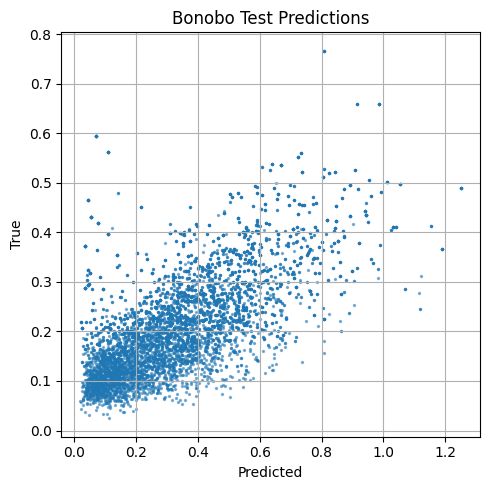


📊 Evaluating on Chimpanzee test set...


Evaluating: 100%|██████████| 113/113 [01:34<00:00,  1.20it/s]

Test Spearman correlation (regression): 0.692


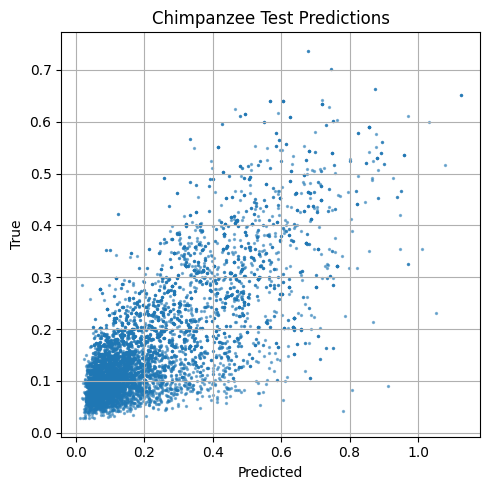


📊 Evaluating on Gorilla test set...


Evaluating: 100%|██████████| 107/107 [01:26<00:00,  1.24it/s]

Test Spearman correlation (regression): 0.602


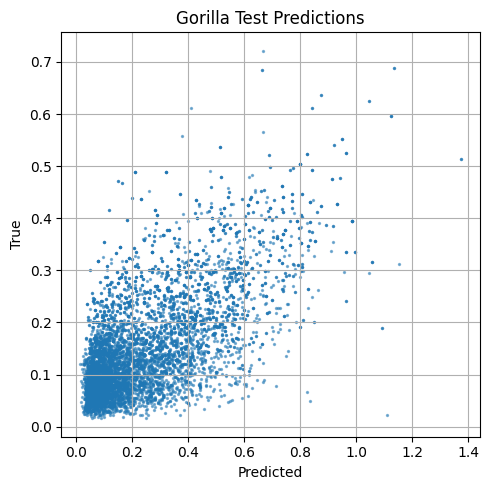


📊 Evaluating on Human test set...


Evaluating: 100%|██████████| 107/107 [00:23<00:00,  4.53it/s]


Test Spearman correlation (regression): 0.677


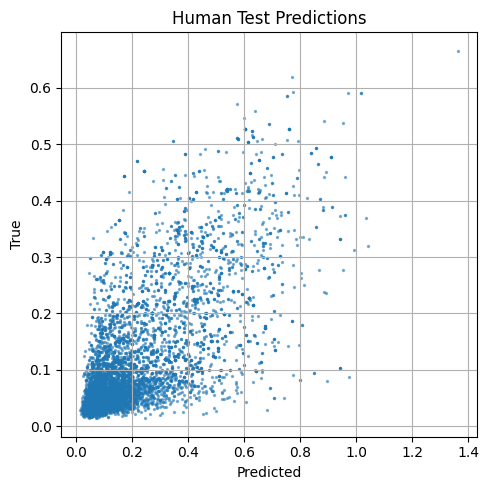


📊 Evaluating on Macaque test set...


Evaluating: 100%|██████████| 104/104 [00:26<00:00,  3.89it/s]


Test Spearman correlation (regression): 0.554


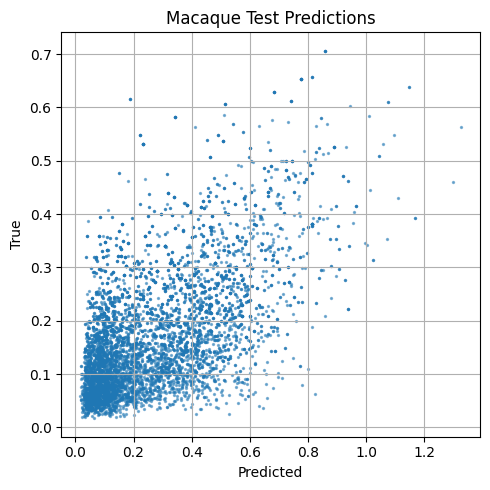


📊 Evaluating on Marmoset test set...


Evaluating: 100%|██████████| 80/80 [00:17<00:00,  4.45it/s]


Test Spearman correlation (regression): 0.465


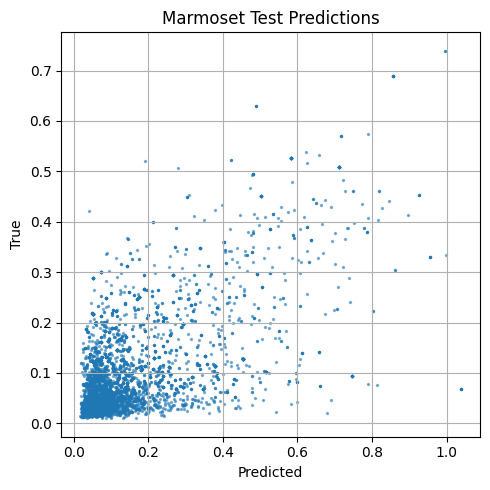

In [26]:
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

species_scores = {}

for species, splits in dataset_dict.items():
    test_ds = splits.get('test')
    if test_ds is None:
        print(f"⚠️ No test dataset for {species}, skipping...")
        continue

    print(f"\n📊 Evaluating on {species} test set...")
    test_loader = DataLoader(test_ds, batch_size=60, shuffle=False)

    # Adjust according to your task
    a2, b2 = evaluate_model(
        model,
        test_loader,
        return_vals=True,
        regression=True,
        classification=False,
        num_classes=len(dataset_dict)
    )

    # Store metrics
    species_scores[species] = {
        "preds": a2,
        "targets": b2,
    }

    # Scatter plot
    plt.figure(figsize=(5, 5))
    plt.scatter(a2, b2, s=2, alpha=0.5)
    plt.title(f"{species} Test Predictions")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [27]:
# ======= EXPLAINABILITY FUNCTIONS IN PURE PYTORCH =======
import torch
import torch.nn.functional as F
import numpy as np

# ============ Saliency Map ============
def compute_saliency_map(model, x, target_class=None):
    """
    Computes saliency map: gradient of output w.r.t input * input.
    Input:
        x: (1, 4, L) torch tensor (requires_grad will be set)
    Output:
        saliency: (1, 4, L) numpy array
    """
    x = x.clone().detach().requires_grad_(True)
    model.eval()

    output_reg, output_clf = model(x)
    if target_class == 'regression':
        target = output_reg
    elif target_class == 'classification':
        target = output_clf
    else:
        target = output_clf  # default

    target.backward(torch.ones_like(target))
    saliency = x.grad * x  # Gradient x Input
    return saliency.detach().cpu().numpy()

# ============ Integrated Gradients ============
def integrated_gradients(model, x, baseline=None, target_class='classification', steps=50):
    """
    Integrated gradients attribution.
    x: (1, 4, L) input
    baseline: (1, 4, L) baseline input (e.g., zeros)
    """
    if baseline is None:
        baseline = torch.zeros_like(x)
    assert x.shape == baseline.shape

    # Generate scaled inputs
    scaled_inputs = [baseline + (float(i) / steps) * (x - baseline) for i in range(steps + 1)]
    scaled_inputs = torch.cat(scaled_inputs, dim=0)  # (steps+1, 4, L)

    scaled_inputs.requires_grad = True
    model.eval()
    outputs = []
    for input_step in scaled_inputs:
        input_step = input_step.unsqueeze(0)
        input_step.requires_grad_(True)
        out_reg, out_clf = model(input_step)
        if target_class == 'regression':
            out = out_reg
        else:
            out = out_clf
        outputs.append(out)
    outputs = torch.cat(outputs)

    total_gradients = torch.autograd.grad(outputs.sum(), scaled_inputs)[0]  # (steps+1, 4, L)
    avg_grads = (total_gradients[:-1] + total_gradients[1:]) / 2.0  # trapezoidal rule
    integrated_grads = (x - baseline).squeeze(0) * avg_grads.mean(dim=0)
    return integrated_grads.detach().cpu().numpy()

# ============ Mutagenesis ============
def in_silico_mutagenesis(model, x, target_class='classification', batch_size=128):
    """
    In silico mutagenesis.
    x: (1, 4, L) one-hot input sequence
    """
    x = x.clone().detach()
    model.eval()
    B, C, L = x.shape
    ref_pred = model(x)[1 if target_class == 'classification' else 0].item()

    # Generate all mutations: for each position and for each nucleotide
    all_mut_seqs = []
    for pos in range(L):
        for base in range(C):
            if x[0, base, pos] == 1:
                continue  # skip wildtype
            mut = x.clone()
            mut[0, :, pos] = 0
            mut[0, base, pos] = 1
            all_mut_seqs.append(mut.clone())

    all_mut_seqs = torch.cat(all_mut_seqs, dim=0)

    preds = []
    for i in range(0, all_mut_seqs.size(0), batch_size):
        batch = all_mut_seqs[i:i+batch_size]
        with torch.no_grad():
            out_reg, out_clf = model(batch)
            out = out_clf if target_class == 'classification' else out_reg
            preds.extend(out.cpu().numpy())

    mut_scores = np.array(preds).reshape(L, C-1)  # shape: (L, 3)
    # Map back to full array with wildtype as 0 delta
    full_scores = np.zeros((L, C))
    k = 0
    for pos in range(L):
        wt_idx = x[0, :, pos].argmax().item()
        b = 0
        for base in range(C):
            if base == wt_idx:
                continue
            full_scores[pos, base] = preds[k] - ref_pred
            k += 1
    return full_scores.T  # shape: (4, L)

# You can now import these into your model script and use them with:
# - compute_saliency_map(model, input_tensor)
# - integrated_gradients(model, input_tensor)
# - in_silico_mutagenesis(model, input_tensor)
# where input_tensor is of shape (1, 4, L) with torch.float32 and requires_grad where needed.


In [28]:
def compute_saliency_map(model, input_tensor, target='regression'):
    """
    Computes saliency map using gradient × input method.

    Args:
        model (nn.Module): Trained PyTorch model.
        input_tensor (torch.Tensor): One-hot encoded input of shape (1, 4, L).
        target (str): 'regression' or 'classification'.

    Returns:
        torch.Tensor: Saliency scores of shape (1, 4, L)
    """
    model.eval()
    device = next(model.parameters()).device
    input_tensor = input_tensor.clone().detach().to(device).requires_grad_(True)

    # Forward pass
    output_reg, output_clf = model(input_tensor)

    if target == 'regression':
        output = output_reg
    elif target == 'classification':
        output = output_clf
    else:
        raise ValueError("target must be 'regression' or 'classification'")

    # Backward pass
    model.zero_grad()
    output.backward(retain_graph=True)

    saliency = input_tensor.grad * input_tensor
    return saliency.detach()

In [34]:
import torch
import pandas as pd
import matplotlib.pyplot as plt
import logomaker

def plot_saliency_logos_from_dataset_dict(model, dataset_dict, region_indices, target='regression'):
    """
    Plot saliency-based nucleotide importance logos across species using test datasets from dataset_dict.

    Parameters:
    - model: trained PyTorch model
    - dataset_dict: dict of {species: {"train": ..., "val": ..., "test": ...}}
    - region_indices: list of indices to visualize
    - target: 'regression' or 'clf'
    """
    device = next(model.parameters()).device
    model.eval()

    for region_idx in region_indices:
        fig, axs = plt.subplots(len(dataset_dict), 1, figsize=(100, 2.5 * len(dataset_dict)), squeeze=False)
        axs = axs[:, 0]  # flatten to 1D list

        for ax, (species, splits) in zip(axs, dataset_dict.items()):
            test_ds = splits.get('test')
            if test_ds is None or region_idx >= len(test_ds):
                ax.set_title(f"{species} (NA)")
                ax.axis('off')
                continue

            x = test_ds[region_idx][0].unsqueeze(0).to(device)  # (1, 4, L)
            saliency = compute_saliency_map(model, x, target=target)  # (1, 4, L)

            contrib = (x * saliency).squeeze(0).detach().cpu().numpy().T  # (L, 4)
            df = pd.DataFrame(contrib, columns=['A', 'C', 'G', 'T'])

            logo = logomaker.Logo(df, ax=ax, shade_below=0, fade_below=0)
            logo.style_spines(visible=False)
            logo.style_spines(spines=['left', 'bottom'], visible=True)
            ax.set_xticks([])
            ax.set_ylabel("Importance", labelpad=-1)
            ax.set_title(species)

        plt.suptitle(f"Region index {region_idx}", y=1.02)
        plt.tight_layout()
        plt.show()
        plt.close()

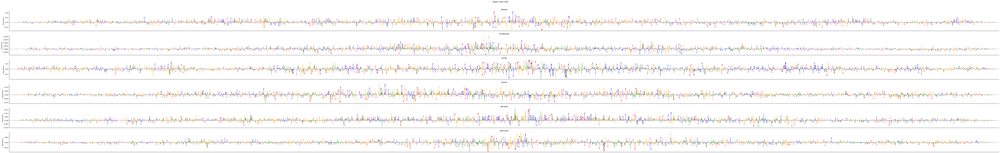

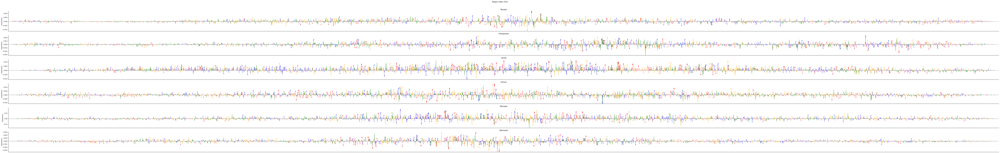

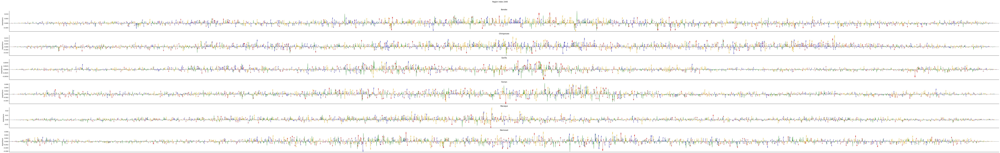

In [35]:
region_indices = [1879, 2410, 2440]
plot_saliency_logos_from_dataset_dict(model, dataset_dict, region_indices, target='regression')

In [39]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import logomaker

def plot_eig_logos_from_dataset_dict(model, dataset_dict, region_indices, target='regression',
                                     num_baselines=10, num_steps=20, device='cuda'):
    """
    Plot Expected Integrated Gradients saliency logos across species for given region indices.

    Parameters:
    - model: trained PyTorch model
    - dataset_dict: dict of {species: {"train": ..., "val": ..., "test": ...}}
    - region_indices: list of region indices to visualize
    - target: "regression" or "clf"
    - num_baselines: number of random baselines to average over
    - num_steps: integration steps
    - device: 'cuda' or 'cpu'
    """
    model.eval()

    for region_idx in region_indices:
        fig, axs = plt.subplots(len(dataset_dict), 1, figsize=(100, 2.5 * len(dataset_dict)), squeeze=False)
        axs = axs[:, 0]  # flatten to 1D

        for ax, (species, splits) in zip(axs, dataset_dict.items()):
            test_ds = splits.get('test')
            if test_ds is None or region_idx >= len(test_ds):
                ax.set_title(f"{species} (NA)")
                ax.axis('off')
                continue

            x = test_ds[region_idx][0].unsqueeze(0).to(device)  # (1, 4, L)
            saliency_eig = expected_integrated_grad(model, x, target="reg" if target == "regression" else "clf",
                                                    num_baselines=num_baselines, num_steps=num_steps, device=device)

            expl = (x * saliency_eig).squeeze(0).detach().cpu().numpy().T  # (L, 4)
            df = pd.DataFrame(expl, columns=['A', 'C', 'G', 'T'])

            logo = logomaker.Logo(df, ax=ax, shade_below=0, fade_below=0)
            logo.style_spines(visible=False)
            logo.style_spines(spines=['left', 'bottom'], visible=True)
            ax.set_xticks([])
            ax.set_ylabel("Importance", labelpad=-1)
            ax.set_title(species)

        plt.suptitle(f"Expected IG - Region index {region_idx}", y=1.02)
        plt.tight_layout()
        plt.show()
        plt.close()

import torch
import numpy as np

def expected_integrated_grad(
    model: torch.nn.Module,
    x: torch.Tensor,  # shape: (1, 4, L)
    target: str = "reg",  # "reg" or "clf"
    num_baselines: int = 10,
    num_steps: int = 20,
    device: str = "cuda"
) -> torch.Tensor:
    """
    Compute Expected Integrated Gradients for a 1D sequence input.

    Args:
        model: trained PyTorch model
        x: one-hot encoded input of shape (1, 4, L)
        target: which output to use ("reg" or "clf")
        num_baselines: how many random shuffles as baselines
        num_steps: how many integration steps
        device: "cuda" or "cpu"

    Returns:
        Attributions of shape (1, 4, L)
    """
    model.eval()
    x = x.to(device).requires_grad_()
    B, C, L = x.shape

    # Generate shuffled baselines
    baselines = []
    x_np = x.detach().cpu().numpy()[0]  # shape (4, L)
    for _ in range(num_baselines):
        shuffled = x_np[:, np.random.permutation(L)]
        baselines.append(torch.tensor(shuffled, dtype=torch.float32, device=device))
    baselines = torch.stack(baselines)  # (B', 4, L)

    # Integration steps
    steps = torch.linspace(0, 1, num_steps + 1, device=device).view(-1, 1, 1, 1)  # (S, 1, 1, 1)

    grads = []

    for baseline in baselines:
        baseline = baseline.unsqueeze(0).expand_as(x)  # (1, 4, L)
        interpolated = baseline + steps * (x - baseline)  # (S, 1, 4, L)
        interpolated = interpolated.squeeze(1).requires_grad_()  # (S, 4, L)

        preds = []
        for i in range(num_steps + 1):
            inp = interpolated[i:i+1]  # shape (1, 4, L)
            inp.requires_grad_()
            out_reg, out_clf = model(inp)
            output = out_reg if target == "reg" else out_clf
            grad = torch.autograd.grad(output.sum(), inp)[0]  # shape (1, 4, L)
            preds.append(grad)

        grads.append(torch.stack(preds))  # shape: (S+1, 1, 4, L)

    grads = torch.stack(grads)  # (B', S+1, 1, 4, L)
    avg_grads = (grads[:, :-1] + grads[:, 1:]) / 2.0  # trapezoidal approx
    avg_grads = avg_grads.mean(dim=1)  # mean over steps → shape (B', 1, 4, L)
    avg_grads = avg_grads.mean(dim=0)  # mean over baselines → shape (1, 4, L)

    # Multiply by (x - baseline_mean)
    baseline_mean = baselines.mean(dim=0, keepdim=True)  # (1, 4, L)
    attributions = (x - baseline_mean) * avg_grads  # (1, 4, L)

    return attributions.detach()

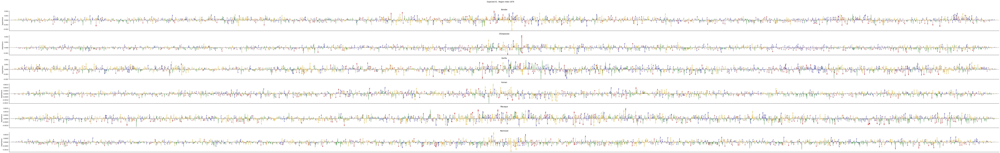

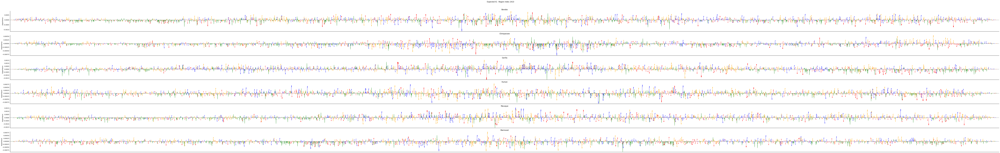

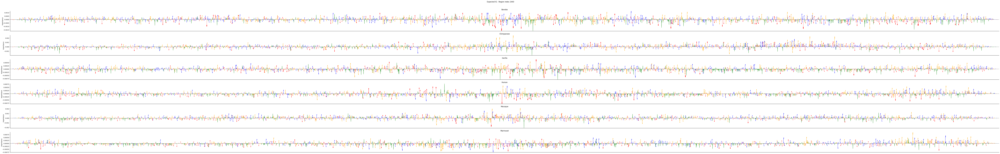

In [40]:
region_indices = [1879, 2410, 2440]
plot_eig_logos_from_dataset_dict(model, dataset_dict, region_indices, target='regression')

In [121]:
saliency_eig = expected_integrated_grad(model2, x, target="reg")

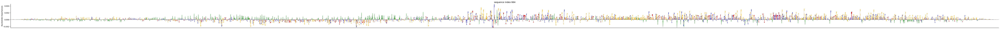

In [122]:
expl = x.cpu()*saliency_eig.cpu()
expl = pd.DataFrame(expl[0])
expl = expl.T
expl.columns = ['A','C','G','T']
seq_df = expl

# create Logo object
import logomaker

crp_logo = logomaker.Logo(seq_df,figsize=(100, 2.5),
                          shade_below=0,
                          fade_below=0)

# style using Logo methods
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
#crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)
crp_logo.ax.set_xticks([])

# style using Axes methods
crp_logo.ax.set_ylabel("Nucleotide Importances", labelpad=-1)
crp_logo.ax.xaxis.set_ticks_position('none')
crp_logo.ax.xaxis.set_tick_params(pad=-1)
plt.title("sequence index "+str(i))
#plt.xticks(ticks=tick_locations,labels = rounded_grid2)
#plt.savefig("region_plots/"+celltype+"_"+region_name+"_"+str(sequence_number)+".png",dpi=350,bbox_inches='tight',pad_inches=0)
#plt.savefig("region_plots/"+celltype+"_"+region_name+"_"+str(sequence_number)+".pdf",dpi=350,bbox_inches='tight',pad_inches=0)

plt.show()
plt.close()

In [ ]:
plot_importance_logo(x, saliency_eig, title="Expected Integrated Gradients (Regression Head)")

In [124]:
importance = expected_integrated_grad(model2, x, target="reg")

# Normalize across nucleotides
normed = importance[0] - importance[0].mean(axis=-1, keepdims=True)

# Optional smoothing (windowed mean or Gaussian)
import scipy.ndimage
smoothed = scipy.ndimage.gaussian_filter1d(normed.cpu(), sigma=1, axis=0)

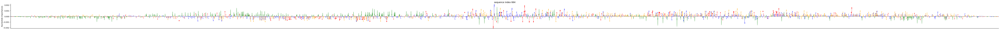

In [127]:
expl = x.cpu()*smoothed
expl = pd.DataFrame(expl[0])
expl = expl.T
expl.columns = ['A','C','G','T']
seq_df = expl

# create Logo object
import logomaker

crp_logo = logomaker.Logo(seq_df,figsize=(100, 2.5),
                          shade_below=0,
                          fade_below=0)

# style using Logo methods
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
#crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)
crp_logo.ax.set_xticks([])

# style using Axes methods
crp_logo.ax.set_ylabel("Nucleotide Importances", labelpad=-1)
crp_logo.ax.xaxis.set_ticks_position('none')
crp_logo.ax.xaxis.set_tick_params(pad=-1)
plt.title("sequence index "+str(i))
#plt.xticks(ticks=tick_locations,labels = rounded_grid2)
#plt.savefig("region_plots/"+celltype+"_"+region_name+"_"+str(sequence_number)+".png",dpi=350,bbox_inches='tight',pad_inches=0)
#plt.savefig("region_plots/"+celltype+"_"+region_name+"_"+str(sequence_number)+".pdf",dpi=350,bbox_inches='tight',pad_inches=0)

plt.show()
plt.close()

In [129]:
import torch
import numpy as np

def compute_smoothgrad(model, x, target="reg", num_samples=50, noise=0.1):
    """
    Compute SmoothGrad explanations for a single input sequence.

    Parameters
    ----------
    model : torch.nn.Module
        Your trained model (with .eval() called).
    x : torch.Tensor
        Input tensor of shape (1, 4, L).
    target : str
        "reg" for regression output, "clf" for classification output.
    num_samples : int
        Number of noisy samples to average over.
    noise : float
        Standard deviation of Gaussian noise to apply to input.

    Returns
    -------
    numpy.ndarray
        Smoothed importance map of shape (L, 4).
    """
    model.eval()
    device = x.device
    x = x.detach().clone().to(device).requires_grad_(True)
    all_grads = []

    for _ in range(num_samples):
        noisy_x = x + noise * torch.randn_like(x)
        noisy_x = torch.clamp(noisy_x, 0, 1)  # keep within 0-1 for one-hot

        output = model(noisy_x)
        target_output = output[0] if target == "reg" else output[1]
        target_output = target_output.sum()

        model.zero_grad()
        target_output.backward(retain_graph=True)
        grad = noisy_x.grad.detach().clone()
        all_grads.append(grad * noisy_x)  # gradient × input

        noisy_x.grad = None

    avg_grad = torch.stack(all_grads).mean(dim=0)
    return avg_grad.squeeze(0).permute(1, 0).cpu().numpy()  # (L, 4)

In [133]:
def compute_smoothgrad(model, x, target="reg", num_samples=50, noise=0.1):
    """
    Compute SmoothGrad explanations for a single input sequence.

    Parameters
    ----------
    model : torch.nn.Module
        Your trained model (should already be .eval() and on correct device).
    x : torch.Tensor
        Input tensor of shape (1, 4, L). Should be on same device as model.
    target : str
        "reg" for regression output, "clf" for classification output.
    num_samples : int
        Number of noisy samples to average over.
    noise : float
        Standard deviation of Gaussian noise to apply to input.

    Returns
    -------
    numpy.ndarray
        Smoothed importance map of shape (L, 4).
    """
    device = next(model.parameters()).device
    model.eval()

    x = x.detach().clone().to(device).requires_grad_(True)
    all_grads = []

    for _ in range(num_samples):
        noisy_x = x + noise * torch.randn_like(x).to(device)
        noisy_x = torch.clamp(noisy_x, 0, 1).detach().clone().requires_grad_(True)

        output = model(noisy_x)
        target_output = output[0] if target == "reg" else output[1]
        target_output = target_output.sum()

        model.zero_grad()
        target_output.backward(retain_graph=True)

        grad = noisy_x.grad.detach().clone()
        all_grads.append(grad * noisy_x)

    avg_grad = torch.stack(all_grads).mean(dim=0)
    return avg_grad.squeeze(0).permute(1, 0).detach().cpu().numpy()  # shape (L, 4)

In [161]:
smooth_sal = compute_smoothgrad(model2, x, target="reg", num_samples=int(1e4), noise=0.15)

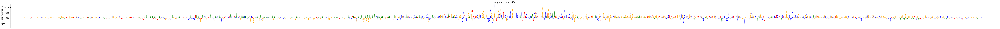

In [162]:
expl = x.cpu()[0]*smooth_sal.T
expl = pd.DataFrame(expl)
expl = expl.T
expl.columns = ['A','C','G','T']
seq_df = expl

# create Logo object
import logomaker

crp_logo = logomaker.Logo(seq_df,figsize=(100, 2.5),
                          shade_below=0,
                          fade_below=0)

# style using Logo methods
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
#crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)
crp_logo.ax.set_xticks([])

# style using Axes methods
crp_logo.ax.set_ylabel("Nucleotide Importances", labelpad=-1)
crp_logo.ax.xaxis.set_ticks_position('none')
crp_logo.ax.xaxis.set_tick_params(pad=-1)
plt.title("sequence index "+str(i))
#plt.xticks(ticks=tick_locations,labels = rounded_grid2)
#plt.savefig("region_plots/"+celltype+"_"+region_name+"_"+str(sequence_number)+".png",dpi=350,bbox_inches='tight',pad_inches=0)
#plt.savefig("region_plots/"+celltype+"_"+region_name+"_"+str(sequence_number)+".pdf",dpi=350,bbox_inches='tight',pad_inches=0)

plt.show()
plt.close()

In [183]:
import torch
import pandas as pd
import matplotlib.pyplot as plt
import logomaker
import numpy as np

def plot_filters_as_logos(
    model,
    top_k=5,
    ranking="l2",  # "l2" or "activation"
    input_seq=None,  # (1, 4, L) tensor (one-hot)
    layer_name="initial.0",  # name of first conv layer
    figsize=(10, 2.5)
):
    """
    Plot top-k first-layer convolutional filters from model as sequence logos.
    
    Parameters:
    - model: the PyTorch model
    - top_k: number of filters to show
    - ranking: "l2" or "activation"
    - input_seq: if ranking="activation", provide a one-hot encoded sequence (1, 4, L)
    - layer_name: name of the first conv layer (default: 'initial.0')
    - figsize: size per filter plot
    """
    conv_layer = dict(model.named_modules())[layer_name]
    weights = conv_layer.weight.detach().cpu()  # (out_channels, in_channels, kernel_size)
    num_filters = weights.shape[0]

    if ranking == "l2":
        norms = torch.norm(weights.view(num_filters, -1), dim=1)
        top_idx = torch.topk(norms, top_k).indices
    elif ranking == "activation":
        if input_seq is None:
            raise ValueError("You must provide input_seq for activation-based ranking.")
        with torch.no_grad():
            act = conv_layer(input_seq.to(next(model.parameters()).device))  # (1, F, L)
            act_mean = act.mean(dim=2).squeeze(0)  # (F,)
            top_idx = torch.topk(act_mean, top_k).indices.cpu()
    else:
        raise ValueError("ranking must be 'l2' or 'activation'")

    bases = ['A', 'C', 'G', 'T']
    for i, f_idx in enumerate(top_idx):
        w = weights[f_idx]  # shape (4, k)
        pwm = w.numpy().T  # shape (k, 4)
        pwm_df = pd.DataFrame(pwm, columns=bases)
        pwm_df = pwm_df.subtract(pwm_df.mean(axis=1), axis=0)

        logomaker.Logo(pwm_df, center_values=True, color_scheme='classic',figsize=figsize)

        plt.title(f'Filter {f_idx.item()} (rank {i+1})')
        plt.xlabel('Position')
        plt.ylabel('Weight')
        plt.show()

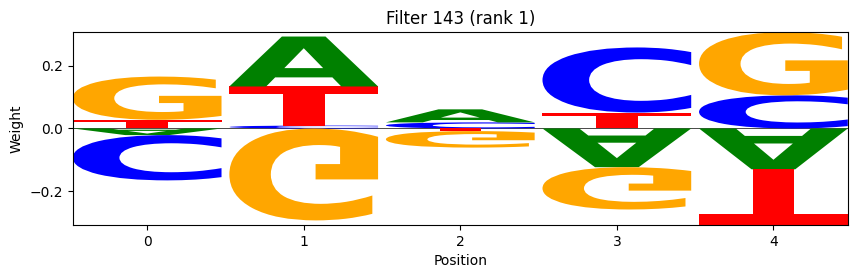

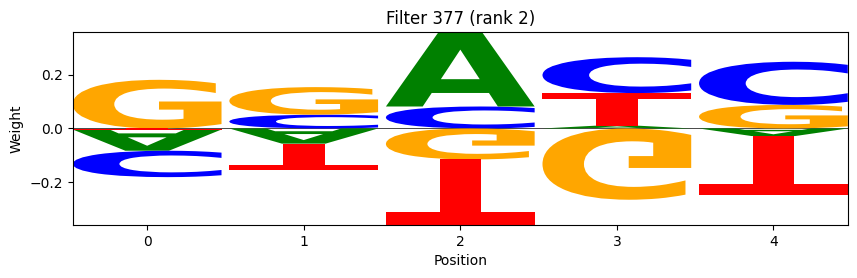

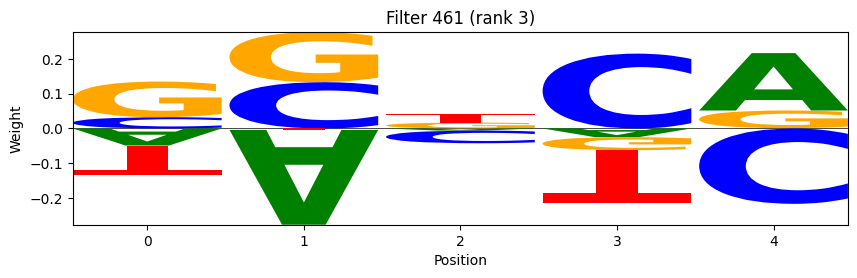

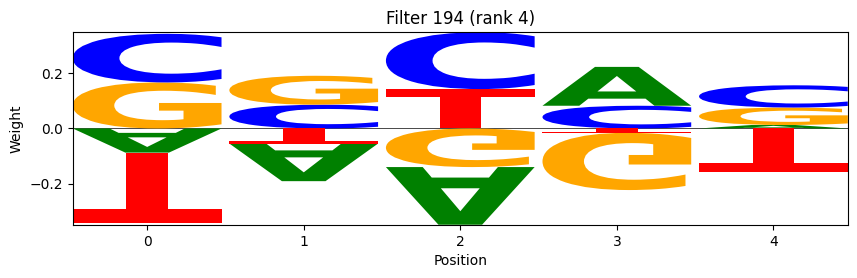

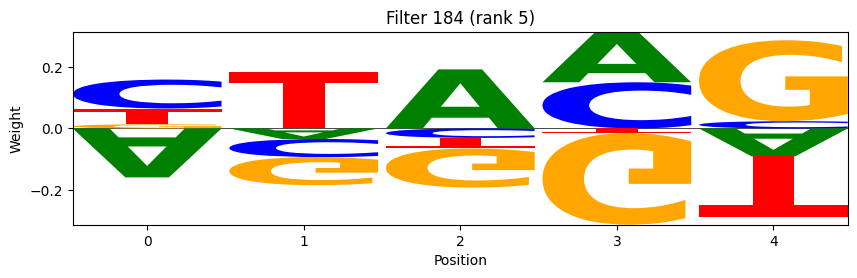

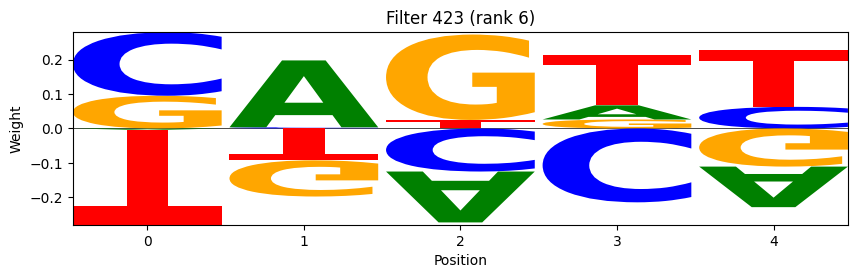

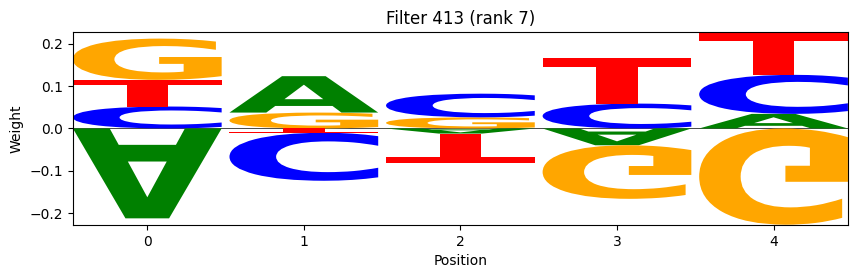

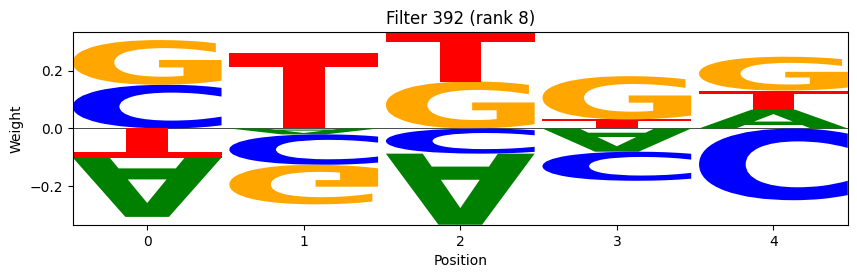

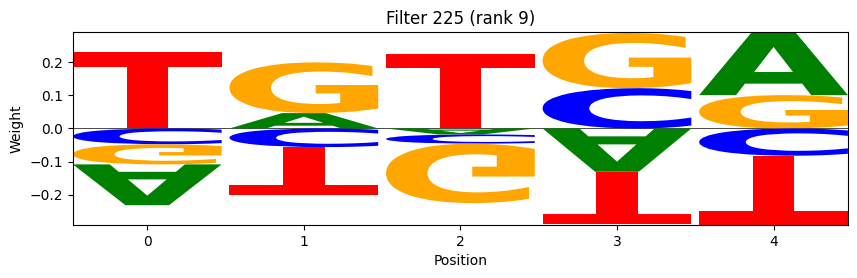

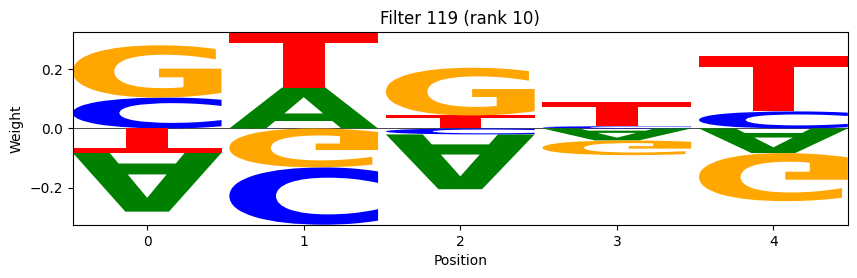

In [184]:
plot_filters_as_logos(model2, top_k=10, ranking="l2")

In [126]:
pd.DataFrame(smoothed)

,0,1,2,3,4,5,6,7,8,9,...,2104,2105,2106,2107,2108,2109,2110,2111,2112,2113
0,-0.000085,-0.000085,-0.000086,-0.000087,-0.000083,-0.000086,-0.000087,-0.000074,-0.000086,-0.000090,...,-0.000092,-0.000087,-0.000073,-0.000088,-0.000083,-0.000087,-0.000086,-0.000086,-0.000086,-0.000085
1,-0.000089,-0.000089,-0.000089,-0.000092,-0.000086,-0.000088,-0.000091,-0.000076,-0.000093,-0.000096,...,-0.000098,-0.000090,-0.000072,-0.000090,-0.000089,-0.000090,-0.000091,-0.000090,-0.000090,-0.000089
2,-0.000086,-0.000086,-0.000082,-0.000088,-0.000084,-0.000078,-0.000085,-0.000080,-0.000091,-0.000090,...,-0.000089,-0.000084,-0.000075,-0.000083,-0.000086,-0.000080,-0.000087,-0.000083,-0.000086,-0.000086
3,-0.000069,-0.000069,-0.000062,-0.000071,-0.000070,-0.000053,-0.000068,-0.000072,-0.000072,-0.000071,...,-0.000068,-0.000070,-0.000067,-0.000067,-0.000070,-0.000057,-0.000069,-0.000062,-0.000069,-0.000069


In [73]:
import logomaker
import matplotlib.pyplot as plt
import pandas as pd

def plot_importance_logo(onehot_tensor, importance_tensor, figsize=(14, 3), title="Nucleotide Importance"):
    """
    Plot a sequence logo based on importance × onehot scores.

    Args:
        onehot_tensor (torch.Tensor): shape (1, 4, L)
        importance_tensor (torch.Tensor): shape (1, 4, L), e.g. saliency from gradient × input
        figsize (tuple): size of the figure
        title (str): title of the plot
    """
    # Convert tensors to numpy
    onehot = onehot_tensor.squeeze().cpu().numpy()      # shape: (4, L)
    importance = importance_tensor.squeeze().cpu().numpy()  # shape: (4, L)

    # Multiply onehot × importance
    weighted = onehot * importance

    # Create pandas dataframe
    df = pd.DataFrame(weighted.T, columns=["A", "C", "G", "T"])

    # Plot
    plt.figure(figsize=figsize)
    logomaker.Logo(df, color_scheme='classic')
    plt.title(title)
    plt.xlabel("Position")
    plt.ylabel("Importance")
    plt.tight_layout()
    plt.show()

<Figure size 1400x300 with 0 Axes>

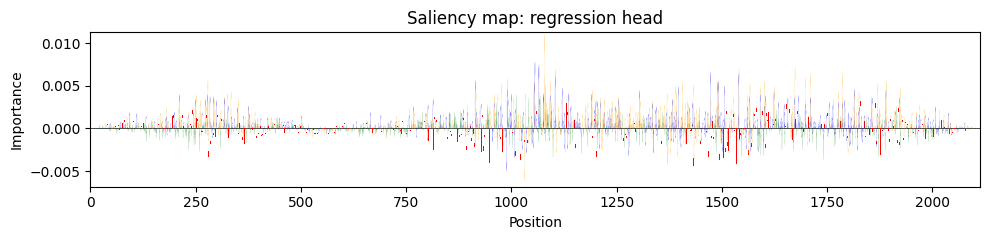

In [74]:
# Example usage
plot_importance_logo(x, saliency, title="Saliency map: regression head")

In [80]:
expl = x.cpu()*saliency.cpu()
expl = pd.DataFrame(expl[0])
expl = expl.T
expl.columns = ['A','C','G','T']
seq_df = expl

Test: 100%|██████████| 85/85 [00:44<00:00,  1.93it/s]

Test correlation: 0.781, Test accuracy: 1.000


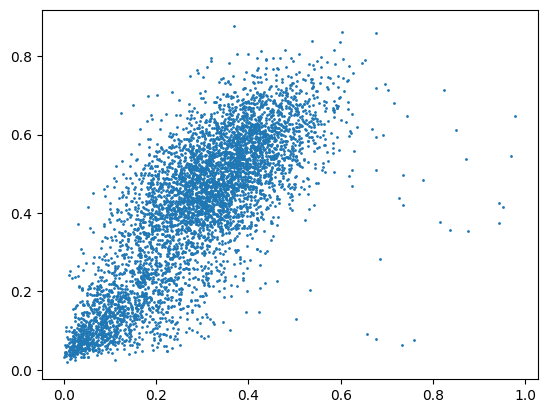

In [49]:
test_loader = DataLoader(ds_chimp_test, batch_size=64)
a2,b2,c2,d2 = evaluate_model(model, test_loader,return_vals=True)
plt.scatter(np.concatenate(a2).ravel(),np.concatenate(b2).ravel(),s=1)
plt.show()

Test: 100%|██████████| 85/85 [00:44<00:00,  1.93it/s]

Test correlation: 0.781, Test accuracy: 1.000


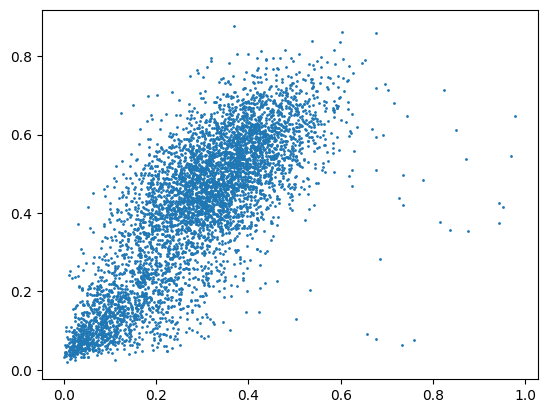

In [60]:
test_loader = DataLoader(ds_chimp_test, batch_size=64)
a2,b2,c2,d2 = evaluate_model(model2, test_loader,return_vals=True)
plt.scatter(np.concatenate(a2).ravel(),np.concatenate(b2).ravel(),s=1)
plt.show()

In [112]:
a2_series = pd.Series(np.concatenate(a2).ravel())

In [114]:
a2_series.sort_values()

4077    0.000908
85      0.001835
4012    0.002687
2484    0.003349
2558    0.003576
          ...   
1130    0.942214
2435    0.942687
2440    0.952564
2410    0.968874
1879    0.978184
Length: 5379, dtype: float32